In [1]:
import pandas as pd
import networkx as nx
import plotly.graph_objects as go

In [2]:
raw_data = pd.read_csv("ChargingRecords.csv")
raw_data

,UserID,ChargerID,ChargerCompany,Location,ChargerType,StartDay,StartTime,EndDay,EndTime,StartDatetime,EndDatetime,Duration,Demand
0,0,1,1,hotel,0,2022-09-15,20:54:02,2022-09-15,23:59:13,2022-09-15 20:54,2022-09-15 23:59,185,20.36
1,0,1,1,hotel,0,2022-09-14,20:01:05,2022-09-14,21:31:04,2022-09-14 20:01,2022-09-14 21:31,90,10.19
2,0,1,1,hotel,0,2022-09-14,18:54:30,2022-09-14,19:54:29,2022-09-14 18:54,2022-09-14 19:54,60,6.78
3,0,1,1,hotel,0,2022-09-29,18:32:51,2022-09-30,0:16:42,2022-09-29 18:32,2022-09-30 0:16,344,37.65
4,0,1,1,hotel,0,2022-09-25,19:30:15,2022-09-26,0:30:14,2022-09-25 19:30,2022-09-26 0:30,300,33.81
...,...,...,...,...,...,...,...,...,...,...,...,...,...
72851,2155,2649,0,public institution,0,2022-01-27,9:54:44,2022-01-27,9:58:57,2022-01-27 9:54,2022-01-27 9:58,4,0.50
72852,2379,2670,0,sightseeing,1,2021-10-31,14:52:11,2021-10-31,15:20:28,2021-10-31 14:52,2021-10-31 15:20,28,16.53
72853,2388,2670,0,sightseeing,1,2021-10-03,13:52:14,2021-10-03,14:32:13,2021-10-03 13:52,2021-10-03 14:32,40,12.20
72854,2388,2671,0,company,1,2021-11-18,11:37:44,2021-11-18,11:45:37,2021-11-18 11:37,2021-11-18 11:45,8,3.80


# Filtering data for another dash

In [3]:
filt_data = raw_data[raw_data["UserID"]!=0]

In [4]:
filt_data.to_csv("charging_records_others_removed.csv",index=False)

# end of filtering, continue with the rest

In [5]:
raw_data["ChargerID"] = raw_data["ChargerID"].map(lambda x: f"ST{x}")

In [6]:
raw_data["UserID"] = raw_data["UserID"].map(lambda x: f"EV{x}")

In [7]:
raw_data

,UserID,ChargerID,ChargerCompany,Location,ChargerType,StartDay,StartTime,EndDay,EndTime,StartDatetime,EndDatetime,Duration,Demand
0,EV0,ST1,1,hotel,0,2022-09-15,20:54:02,2022-09-15,23:59:13,2022-09-15 20:54,2022-09-15 23:59,185,20.36
1,EV0,ST1,1,hotel,0,2022-09-14,20:01:05,2022-09-14,21:31:04,2022-09-14 20:01,2022-09-14 21:31,90,10.19
2,EV0,ST1,1,hotel,0,2022-09-14,18:54:30,2022-09-14,19:54:29,2022-09-14 18:54,2022-09-14 19:54,60,6.78
3,EV0,ST1,1,hotel,0,2022-09-29,18:32:51,2022-09-30,0:16:42,2022-09-29 18:32,2022-09-30 0:16,344,37.65
4,EV0,ST1,1,hotel,0,2022-09-25,19:30:15,2022-09-26,0:30:14,2022-09-25 19:30,2022-09-26 0:30,300,33.81
...,...,...,...,...,...,...,...,...,...,...,...,...,...
72851,EV2155,ST2649,0,public institution,0,2022-01-27,9:54:44,2022-01-27,9:58:57,2022-01-27 9:54,2022-01-27 9:58,4,0.50
72852,EV2379,ST2670,0,sightseeing,1,2021-10-31,14:52:11,2021-10-31,15:20:28,2021-10-31 14:52,2021-10-31 15:20,28,16.53
72853,EV2388,ST2670,0,sightseeing,1,2021-10-03,13:52:14,2021-10-03,14:32:13,2021-10-03 13:52,2021-10-03 14:32,40,12.20
72854,EV2388,ST2671,0,company,1,2021-11-18,11:37:44,2021-11-18,11:45:37,2021-11-18 11:37,2021-11-18 11:45,8,3.80


In [8]:
len(raw_data["UserID"].unique())

2337

In [9]:
len(raw_data["ChargerID"].unique())

2119

In [10]:
# Demand--> edge
# location --> chargerID attr
# charger company --> chargerID attr
# charger type --> chargerID attr
G = nx.from_pandas_edgelist(raw_data, "UserID", 'ChargerID', ['Demand', 'Duration'])

In [11]:
G.edges(data=True)

EdgeDataView([('EV0', 'ST1', {'Demand': 0.11, 'Duration': 2}), ('EV0', 'ST2', {'Demand': 0.14, 'Duration': 2}), ('EV0', 'ST3', {'Demand': 15.39, 'Duration': 388}), ('EV0', 'ST5', {'Demand': 18.7, 'Duration': 166}), ('EV0', 'ST7', {'Demand': 12.2, 'Duration': 107}), ('EV0', 'ST8', {'Demand': 22.3, 'Duration': 205}), ('EV0', 'ST9', {'Demand': 6.92, 'Duration': 64}), ('EV0', 'ST10', {'Demand': 7.12, 'Duration': 78}), ('EV0', 'ST13', {'Demand': 5.2, 'Duration': 44}), ('EV0', 'ST14', {'Demand': 2.71, 'Duration': 23}), ('EV0', 'ST15', {'Demand': 7.6, 'Duration': 67}), ('EV0', 'ST16', {'Demand': 0.2, 'Duration': 1}), ('EV0', 'ST17', {'Demand': 7.27, 'Duration': 62}), ('EV0', 'ST18', {'Demand': 16.78, 'Duration': 157}), ('EV0', 'ST19', {'Demand': 2.75, 'Duration': 25}), ('EV0', 'ST20', {'Demand': 22.4, 'Duration': 202}), ('EV0', 'ST21', {'Demand': 7.5, 'Duration': 66}), ('EV0', 'ST22', {'Demand': 9.5, 'Duration': 91}), ('EV0', 'ST23', {'Demand': 0.77, 'Duration': 13}), ('EV0', 'ST24', {'Demand

In [12]:
nodes = G.nodes()
nodes

NodeView(('EV0', 'ST1', 'EV14', 'EV156', 'EV246', 'EV330', 'EV479', 'EV511', 'EV565', 'EV675', 'EV811', 'EV838', 'EV902', 'EV921', 'EV1068', 'EV1193', 'EV1253', 'EV1265', 'EV1283', 'EV1317', 'EV1351', 'EV1382', 'EV1538', 'EV1584', 'EV1587', 'EV1639', 'EV1646', 'EV1728', 'EV1732', 'EV1741', 'EV1793', 'EV1843', 'EV1852', 'EV1875', 'EV1885', 'EV1889', 'EV2024', 'EV2026', 'EV2033', 'EV2036', 'EV2045', 'EV2069', 'EV2073', 'EV2076', 'EV2090', 'EV2327', 'EV2384', 'ST2', 'EV297', 'EV332', 'EV404', 'EV494', 'EV580', 'EV672', 'EV776', 'EV872', 'EV989', 'EV1015', 'EV1025', 'EV1179', 'EV1323', 'ST3', 'EV238', 'EV318', 'EV333', 'EV886', 'EV903', 'EV1197', 'EV1407', 'EV1417', 'EV1888', 'EV1935', 'EV2293', 'EV2431', 'ST5', 'EV95', 'EV98', 'EV109', 'EV190', 'EV508', 'EV603', 'ST7', 'EV40', 'ST8', 'EV697', 'EV1094', 'ST9', 'EV1', 'EV76', 'EV716', 'EV783', 'EV1270', 'EV1360', 'EV1508', 'EV2144', 'EV2304', 'EV2408', 'EV2467', 'ST10', 'EV180', 'EV646', 'EV2057', 'ST13', 'EV13', 'EV31', 'EV42', 'EV64', 'EV

In [42]:
# def tie_strength(G, v, w):
#     # Get neighbors of nodes v and w in G
#     v_neighbors = set(G.neighbors(v))
#     w_neighbors = set(G.neighbors(w))
#     # Return size of the set intersection
#     return 1 + len(v_neighbors & w_neighbors)

# # Calculate weight for each edge
# for v, w in G.edges:
#     G.edges[v, w]["weight"] = tie_strength(G, v, w)

In [13]:
loc_dict = {}
for charger_id,loc in zip(raw_data["ChargerID"],raw_data["Location"]):
    loc_dict[charger_id] = loc   

In [14]:
loc_dict

{'ST1': 'hotel',
 'ST2': 'hotel',
 'ST3': 'company',
 'ST5': 'apartment',
 'ST7': 'resort',
 'ST8': 'hotel',
 'ST9': 'hotel',
 'ST10': 'hotel',
 'ST13': 'apartment',
 'ST14': 'public area',
 'ST15': 'company',
 'ST16': 'apartment',
 'ST17': 'company',
 'ST18': 'hotel',
 'ST19': 'resort',
 'ST20': 'resort',
 'ST21': 'apartment',
 'ST22': 'hotel',
 'ST23': 'public area',
 'ST24': 'public institution',
 'ST25': 'hotel',
 'ST26': 'public area',
 'ST27': 'restaurant',
 'ST28': 'apartment',
 'ST29': 'resort',
 'ST30': 'resort',
 'ST32': 'hotel',
 'ST33': 'apartment',
 'ST34': 'restaurant',
 'ST37': 'company',
 'ST38': 'hotel',
 'ST42': 'hotel',
 'ST43': 'resort',
 'ST44': 'apartment',
 'ST45': 'company',
 'ST46': 'hotel',
 'ST48': 'apartment',
 'ST49': 'public area',
 'ST50': 'public area',
 'ST52': 'apartment',
 'ST54': 'resort',
 'ST55': 'resort',
 'ST56': 'public area',
 'ST59': 'apartment',
 'ST60': 'public area',
 'ST61': 'hotel',
 'ST62': 'public area',
 'ST64': 'apartment',
 'ST65': '

In [15]:
# Set the locations as node attributes
nx.set_node_attributes(G, loc_dict, 'location')

In [16]:
G.nodes(data=True)

NodeDataView({'EV0': {}, 'ST1': {'location': 'hotel'}, 'EV14': {}, 'EV156': {}, 'EV246': {}, 'EV330': {}, 'EV479': {}, 'EV511': {}, 'EV565': {}, 'EV675': {}, 'EV811': {}, 'EV838': {}, 'EV902': {}, 'EV921': {}, 'EV1068': {}, 'EV1193': {}, 'EV1253': {}, 'EV1265': {}, 'EV1283': {}, 'EV1317': {}, 'EV1351': {}, 'EV1382': {}, 'EV1538': {}, 'EV1584': {}, 'EV1587': {}, 'EV1639': {}, 'EV1646': {}, 'EV1728': {}, 'EV1732': {}, 'EV1741': {}, 'EV1793': {}, 'EV1843': {}, 'EV1852': {}, 'EV1875': {}, 'EV1885': {}, 'EV1889': {}, 'EV2024': {}, 'EV2026': {}, 'EV2033': {}, 'EV2036': {}, 'EV2045': {}, 'EV2069': {}, 'EV2073': {}, 'EV2076': {}, 'EV2090': {}, 'EV2327': {}, 'EV2384': {}, 'ST2': {'location': 'hotel'}, 'EV297': {}, 'EV332': {}, 'EV404': {}, 'EV494': {}, 'EV580': {}, 'EV672': {}, 'EV776': {}, 'EV872': {}, 'EV989': {}, 'EV1015': {}, 'EV1025': {}, 'EV1179': {}, 'EV1323': {}, 'ST3': {'location': 'company'}, 'EV238': {}, 'EV318': {}, 'EV333': {}, 'EV886': {}, 'EV903': {}, 'EV1197': {}, 'EV1407': {}, 

In [17]:
charg_company_dict = {}
for charger_id,chc in zip(raw_data["ChargerID"],raw_data["ChargerCompany"]):
    charg_company_dict[charger_id] = chc

In [18]:
charg_company_dict

{'ST1': 1,
 'ST2': 1,
 'ST3': 1,
 'ST5': 1,
 'ST7': 1,
 'ST8': 1,
 'ST9': 1,
 'ST10': 1,
 'ST13': 1,
 'ST14': 1,
 'ST15': 1,
 'ST16': 1,
 'ST17': 1,
 'ST18': 1,
 'ST19': 1,
 'ST20': 1,
 'ST21': 1,
 'ST22': 1,
 'ST23': 1,
 'ST24': 1,
 'ST25': 1,
 'ST26': 1,
 'ST27': 1,
 'ST28': 1,
 'ST29': 1,
 'ST30': 1,
 'ST32': 1,
 'ST33': 1,
 'ST34': 1,
 'ST37': 1,
 'ST38': 1,
 'ST42': 1,
 'ST43': 1,
 'ST44': 1,
 'ST45': 1,
 'ST46': 1,
 'ST48': 1,
 'ST49': 1,
 'ST50': 1,
 'ST52': 1,
 'ST54': 1,
 'ST55': 1,
 'ST56': 1,
 'ST59': 1,
 'ST60': 1,
 'ST61': 1,
 'ST62': 1,
 'ST64': 1,
 'ST65': 1,
 'ST66': 1,
 'ST68': 1,
 'ST69': 1,
 'ST72': 1,
 'ST73': 1,
 'ST74': 1,
 'ST76': 1,
 'ST77': 1,
 'ST79': 1,
 'ST80': 1,
 'ST81': 1,
 'ST82': 1,
 'ST83': 1,
 'ST84': 1,
 'ST85': 1,
 'ST86': 1,
 'ST87': 1,
 'ST88': 1,
 'ST89': 1,
 'ST90': 1,
 'ST91': 1,
 'ST92': 1,
 'ST93': 1,
 'ST95': 1,
 'ST96': 1,
 'ST97': 1,
 'ST99': 1,
 'ST100': 1,
 'ST101': 1,
 'ST102': 1,
 'ST103': 1,
 'ST104': 1,
 'ST105': 1,
 'ST107': 1,
 'ST

In [19]:
# Set the charging company as node attributes
nx.set_node_attributes(G, charg_company_dict, 'charging_company')

In [20]:
G.nodes(data=True)

NodeDataView({'EV0': {}, 'ST1': {'location': 'hotel', 'charging_company': 1}, 'EV14': {}, 'EV156': {}, 'EV246': {}, 'EV330': {}, 'EV479': {}, 'EV511': {}, 'EV565': {}, 'EV675': {}, 'EV811': {}, 'EV838': {}, 'EV902': {}, 'EV921': {}, 'EV1068': {}, 'EV1193': {}, 'EV1253': {}, 'EV1265': {}, 'EV1283': {}, 'EV1317': {}, 'EV1351': {}, 'EV1382': {}, 'EV1538': {}, 'EV1584': {}, 'EV1587': {}, 'EV1639': {}, 'EV1646': {}, 'EV1728': {}, 'EV1732': {}, 'EV1741': {}, 'EV1793': {}, 'EV1843': {}, 'EV1852': {}, 'EV1875': {}, 'EV1885': {}, 'EV1889': {}, 'EV2024': {}, 'EV2026': {}, 'EV2033': {}, 'EV2036': {}, 'EV2045': {}, 'EV2069': {}, 'EV2073': {}, 'EV2076': {}, 'EV2090': {}, 'EV2327': {}, 'EV2384': {}, 'ST2': {'location': 'hotel', 'charging_company': 1}, 'EV297': {}, 'EV332': {}, 'EV404': {}, 'EV494': {}, 'EV580': {}, 'EV672': {}, 'EV776': {}, 'EV872': {}, 'EV989': {}, 'EV1015': {}, 'EV1025': {}, 'EV1179': {}, 'EV1323': {}, 'ST3': {'location': 'company', 'charging_company': 1}, 'EV238': {}, 'EV318': {}

In [21]:
ChargerType_dict = {}
for charger_id,ct in zip(raw_data["ChargerID"],raw_data["ChargerType"]):
    ChargerType_dict[charger_id] = ct

In [22]:
len(ChargerType_dict)

2119

In [23]:
# Set the charging type as node attributes
nx.set_node_attributes(G, ChargerType_dict, 'charger_type')

In [24]:
G.nodes(data=True)

NodeDataView({'EV0': {}, 'ST1': {'location': 'hotel', 'charging_company': 1, 'charger_type': 0}, 'EV14': {}, 'EV156': {}, 'EV246': {}, 'EV330': {}, 'EV479': {}, 'EV511': {}, 'EV565': {}, 'EV675': {}, 'EV811': {}, 'EV838': {}, 'EV902': {}, 'EV921': {}, 'EV1068': {}, 'EV1193': {}, 'EV1253': {}, 'EV1265': {}, 'EV1283': {}, 'EV1317': {}, 'EV1351': {}, 'EV1382': {}, 'EV1538': {}, 'EV1584': {}, 'EV1587': {}, 'EV1639': {}, 'EV1646': {}, 'EV1728': {}, 'EV1732': {}, 'EV1741': {}, 'EV1793': {}, 'EV1843': {}, 'EV1852': {}, 'EV1875': {}, 'EV1885': {}, 'EV1889': {}, 'EV2024': {}, 'EV2026': {}, 'EV2033': {}, 'EV2036': {}, 'EV2045': {}, 'EV2069': {}, 'EV2073': {}, 'EV2076': {}, 'EV2090': {}, 'EV2327': {}, 'EV2384': {}, 'ST2': {'location': 'hotel', 'charging_company': 1, 'charger_type': 0}, 'EV297': {}, 'EV332': {}, 'EV404': {}, 'EV494': {}, 'EV580': {}, 'EV672': {}, 'EV776': {}, 'EV872': {}, 'EV989': {}, 'EV1015': {}, 'EV1025': {}, 'EV1179': {}, 'EV1323': {}, 'ST3': {'location': 'company', 'charging_

In [26]:
number_of_conections = {}
for adjacencies,node in zip(G.adjacency(),G.nodes()):
    number_of_conections[node] = len(adjacencies[1])
    # node_text.append(f'{node}: '+str(len(adjacencies[1])))

In [27]:
number_of_conections

{'EV0': 309,
 'ST1': 46,
 'EV14': 18,
 'EV156': 39,
 'EV246': 33,
 'EV330': 18,
 'EV479': 35,
 'EV511': 9,
 'EV565': 3,
 'EV675': 1,
 'EV811': 2,
 'EV838': 3,
 'EV902': 2,
 'EV921': 3,
 'EV1068': 2,
 'EV1193': 1,
 'EV1253': 2,
 'EV1265': 1,
 'EV1283': 15,
 'EV1317': 1,
 'EV1351': 1,
 'EV1382': 1,
 'EV1538': 1,
 'EV1584': 2,
 'EV1587': 1,
 'EV1639': 2,
 'EV1646': 7,
 'EV1728': 1,
 'EV1732': 1,
 'EV1741': 2,
 'EV1793': 1,
 'EV1843': 1,
 'EV1852': 2,
 'EV1875': 3,
 'EV1885': 2,
 'EV1889': 3,
 'EV2024': 1,
 'EV2026': 1,
 'EV2033': 1,
 'EV2036': 1,
 'EV2045': 1,
 'EV2069': 2,
 'EV2073': 1,
 'EV2076': 1,
 'EV2090': 6,
 'EV2327': 1,
 'EV2384': 13,
 'ST2': 15,
 'EV297': 1,
 'EV332': 1,
 'EV404': 2,
 'EV494': 1,
 'EV580': 1,
 'EV672': 1,
 'EV776': 1,
 'EV872': 1,
 'EV989': 1,
 'EV1015': 1,
 'EV1025': 2,
 'EV1179': 1,
 'EV1323': 1,
 'ST3': 13,
 'EV238': 1,
 'EV318': 15,
 'EV333': 27,
 'EV886': 2,
 'EV903': 1,
 'EV1197': 3,
 'EV1407': 10,
 'EV1417': 6,
 'EV1888': 1,
 'EV1935': 1,
 'EV2293': 1,
 '

In [28]:
# Set the number of connections as node attributes
nx.set_node_attributes(G, number_of_conections, 'number_of_connections')

In [29]:
G.nodes(data=True)

NodeDataView({'EV0': {'number_of_connections': 309}, 'ST1': {'location': 'hotel', 'charging_company': 1, 'charger_type': 0, 'number_of_connections': 46}, 'EV14': {'number_of_connections': 18}, 'EV156': {'number_of_connections': 39}, 'EV246': {'number_of_connections': 33}, 'EV330': {'number_of_connections': 18}, 'EV479': {'number_of_connections': 35}, 'EV511': {'number_of_connections': 9}, 'EV565': {'number_of_connections': 3}, 'EV675': {'number_of_connections': 1}, 'EV811': {'number_of_connections': 2}, 'EV838': {'number_of_connections': 3}, 'EV902': {'number_of_connections': 2}, 'EV921': {'number_of_connections': 3}, 'EV1068': {'number_of_connections': 2}, 'EV1193': {'number_of_connections': 1}, 'EV1253': {'number_of_connections': 2}, 'EV1265': {'number_of_connections': 1}, 'EV1283': {'number_of_connections': 15}, 'EV1317': {'number_of_connections': 1}, 'EV1351': {'number_of_connections': 1}, 'EV1382': {'number_of_connections': 1}, 'EV1538': {'number_of_connections': 1}, 'EV1584': {'n

In [50]:
node_attributes = list(G.nodes(data=True))

AttributeError: 'NodeDataView' object has no attribute 'copy'

In [33]:
len(node_attributes)

4456

In [34]:
pos = nx.spring_layout(G)

In [35]:
pos

{'EV0': array([-0.00918625,  0.01045901]),
 'ST1': array([-0.04123773,  0.10347951]),
 'EV14': array([-0.02797256, -0.00067976]),
 'EV156': array([-0.00666463, -0.00112445]),
 'EV246': array([-0.00122327,  0.02839674]),
 'EV330': array([-0.02972648,  0.00160115]),
 'EV479': array([-0.00840736,  0.00832533]),
 'EV511': array([0.02742664, 0.06980627]),
 'EV565': array([-0.0220726,  0.1044168]),
 'EV675': array([-0.05547106,  0.16126391]),
 'EV811': array([-0.06339423,  0.12798949]),
 'EV838': array([-0.06709805,  0.09917258]),
 'EV902': array([-0.02324416,  0.14689866]),
 'EV921': array([-0.02257724,  0.14006774]),
 'EV1068': array([-0.02326999,  0.14688076]),
 'EV1193': array([-0.06106025,  0.15778723]),
 'EV1253': array([-0.02327144,  0.14687937]),
 'EV1265': array([-0.06027273,  0.16114117]),
 'EV1283': array([-0.02651657,  0.04266534]),
 'EV1317': array([-0.06487431,  0.15434995]),
 'EV1351': array([-0.06432128,  0.15441562]),
 'EV1382': array([-0.05717264,  0.15794548]),
 'EV1538': 

In [36]:
# Set the positions as node attributes
nx.set_node_attributes(G, pos, 'pos')

# drawing

In [37]:
len(G.nodes)

4456

In [38]:
len(G.edges)

11372

In [39]:
# G = nx.random_geometric_graph(200, 0.125)

In [40]:
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = G.nodes[edge[0]]['pos']
    x1, y1 = G.nodes[edge[1]]['pos']
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

In [41]:
edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

In [42]:
node_x = []
node_y = []
for node in G.nodes():
    x, y = G.nodes[node]['pos']
    node_x.append(x)
    node_y.append(y)

In [43]:
node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        # colorscale options
        #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
        #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
        #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
        colorscale='YlGnBu',
        reversescale=True,
        color=[],
        size=10,
        colorbar=dict(
            thickness=15,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        ),
        line_width=2))

In [44]:
len(list(G.nodes))

4456

In [45]:
shape_nodes = []
for node in list(G.nodes):
    if node.startswith("ST"):
        shape_nodes.append("diamond")
    if node.startswith("EV"):
        shape_nodes.append("circle")

In [46]:
len(shape_nodes)

4456

In [47]:
node_adjacencies = []
node_text = []
for adjacencies,node in zip(G.adjacency(),G.nodes()):
    node_adjacencies.append(len(adjacencies[1]))
    node_text.append(f'{node}: '+str(len(adjacencies[1])))
    
# node_trace.marker.size = node_adjacencies
node_trace.marker.symbol = shape_nodes
node_trace.marker.color = node_adjacencies
node_trace.text = node_attributes
# node_trace.name = node_text

In [48]:
len(node_text)

4456

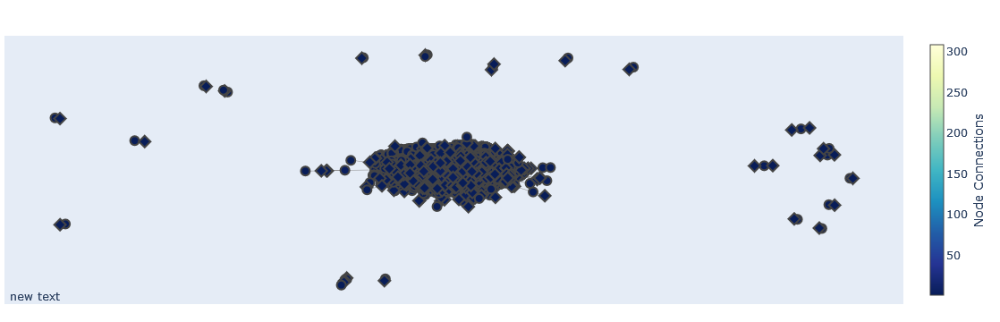

In [49]:
fig = go.Figure(data=[edge_trace, node_trace],
             layout=go.Layout(
                # title='<br>Network graph made with Python',
                # titlefont_size=16,
                showlegend=False,
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                annotations=[ dict(
                    #text="Python code: <a href='https://plotly.com/python/network-graphs/'> https://plotly.com/python/network-graphs/</a>",
                    showarrow=False,
                    xref="paper", yref="paper",
                    x=0.005, y=-0.002 ) ],
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )
fig.show()

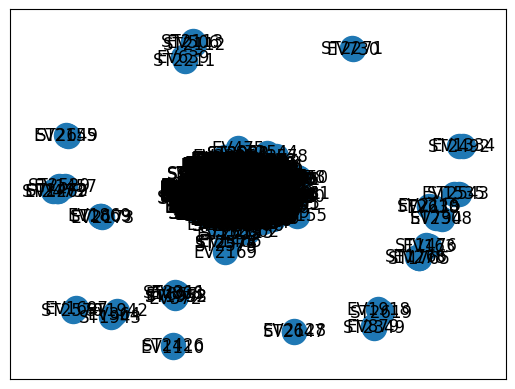

In [18]:
nx.draw_networkx(G,pos=nx.spring_layout(G),with_labels=True)